Including all Necessary Import statements

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from collections import Counter

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

Setting Custom NLTK Data Path

Explanation: This snippet configures a custom path for NLTK data, allowing the code to locate necessary datasets and resources in a specified directory on the user's computer.

Define custom path:

nltk_data_path: Specifies the path to the folder where NLTK data is stored (C:\Users\saath\AppData\Roaming\nltk_data).
Add custom path to NLTK:

nltk.data.path.append(nltk_data_path): Adds the specified path to the list of directories NLTK searches for data.
Verify path:

print(nltk.data.path): Prints the list of paths, confirming the addition of the custom path to NLTK’s search directories.

In [ ]:
import nltk
import os

nltk_data_path = r'C:\Users\saath\AppData\Roaming\nltk_data'
nltk.data.path.append(nltk_data_path)

# Verify the path
print(nltk.data.path)

['C:\\Users\\saath/nltk_data', 'C:\\Users\\saath\\AppData\\Local\\Programs\\Python\\Python311\\nltk_data', 'C:\\Users\\saath\\AppData\\Local\\Programs\\Python\\Python311\\share\\nltk_data', 'C:\\Users\\saath\\AppData\\Local\\Programs\\Python\\Python311\\lib\\nltk_data', 'C:\\Users\\saath\\AppData\\Roaming\\nltk_data', 'C:\\nltk_data', 'D:\\nltk_data', 'E:\\nltk_data', 'C:\\Users\\saath\\AppData\\Roaming\\nltk_data']


In [ ]:
import os
import nltk

nltk_data_path = r'C:\Users\saath\AppData\Roaming\nltk_data'
print(f"Punkt exists: {os.path.exists(os.path.join(nltk_data_path, 'tokenizers', 'punkt'))}")
print(f"Stopwords exists: {os.path.exists(os.path.join(nltk_data_path, 'corpora', 'stopwords'))}")

Punkt exists: True
Stopwords exists: True


In [ ]:
import os

file_path = r"C:\Users\saath\OneDrive\Desktop\Project NLP\TIL Dataset(Cleaned).csv"
if os.path.exists(file_path):
    print("File exists")
else:
    print("File does not exist")

File exists


Loading the dataset and printing the first 5 rows

In [ ]:
# Load the dataset
df = pd.read_csv(r"C:\Users\saath\OneDrive\Desktop\Project NLP\TIL Dataset(Cleaned).csv")

# Display basic information about the dataset
print(df.info())

# Display the first few rows
print(df.head())

# Check class distribution
print(df['target'].value_counts())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 871909 entries, 0 to 871908
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   text        871909 non-null  object
 1   target      871909 non-null  object
 2   Word Count  871909 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 20.0+ MB
None
                                                text              target  \
0   python courses python courses, python exercis...  academic interests   
1  the learning point open digital education. a r...  academic interests   
2   equl offers enzyme assay kits, reagent mixtur...  academic interests   
3  tech news, latest technology, mobiles, laptops...  academic interests   
4  the best it certification materials in usa | k...  academic interests   

   Word Count  
0         125  
1         147  
2         353  
3         143  
4         364  
target
academic interests                           73134
books and literatu

In [ ]:
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     C:\Users\saath\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_eng is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\saath\AppData\Roaming\nltk_data...
[

True

Data Preprocessing:

Text Preprocessing Function for NLP

Explanation: This snippet defines a function, preprocess_text, which cleans and processes raw text data to prepare it for machine learning or NLP tasks. The function removes HTML tags, special characters, and stopwords and then tokenizes and normalizes the text.

In [ ]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

def preprocess_text(text):
    # Remove HTML tags
    text = re.sub('<[^>]*>', '', text)
    # Remove special characters and digits
    text = re.sub('[^a-zA-Z\s]', '', text)
    # Convert to lowercase
    text = text.lower()
    # Tokenize
    tokens = word_tokenize(text)
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(tokens)

# Apply preprocessing to the 'text' column
df['cleaned_text'] = df['text'].apply(preprocess_text)

# Display a sample of cleaned text
print(df['cleaned_text'].head())

0    python courses python courses python exercise ...
1    learning point open digital education reposito...
2    equl offers enzyme assay kits reagent mixtures...
3    tech news latest technology mobiles laptops nd...
4    best certification materials usa killtest lead...
Name: cleaned_text, dtype: object


Exploratory Data Analysis (EDA) for Text Data

Explanation: This code snippet performs an exploratory analysis of the text dataset, providing visual insights into class distribution, text length, and common words for each category. The goal is to understand data characteristics before further processing and model training.

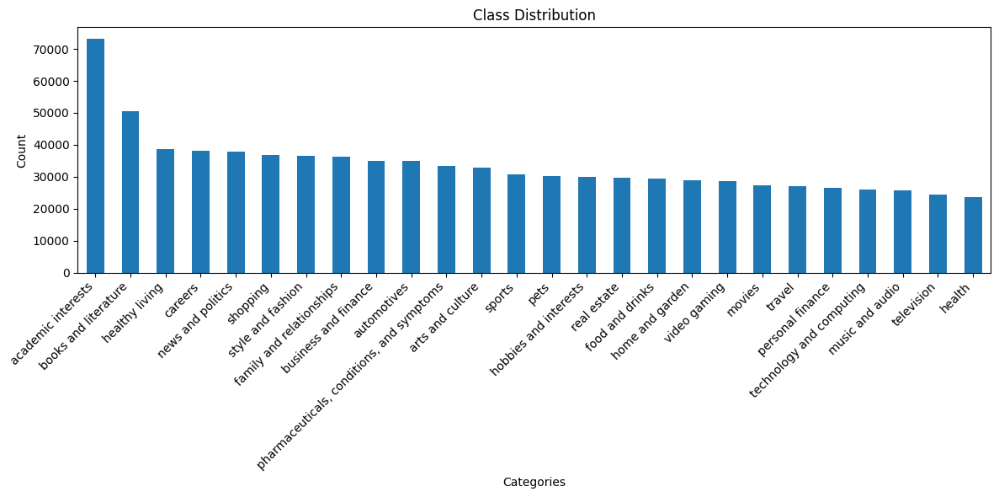

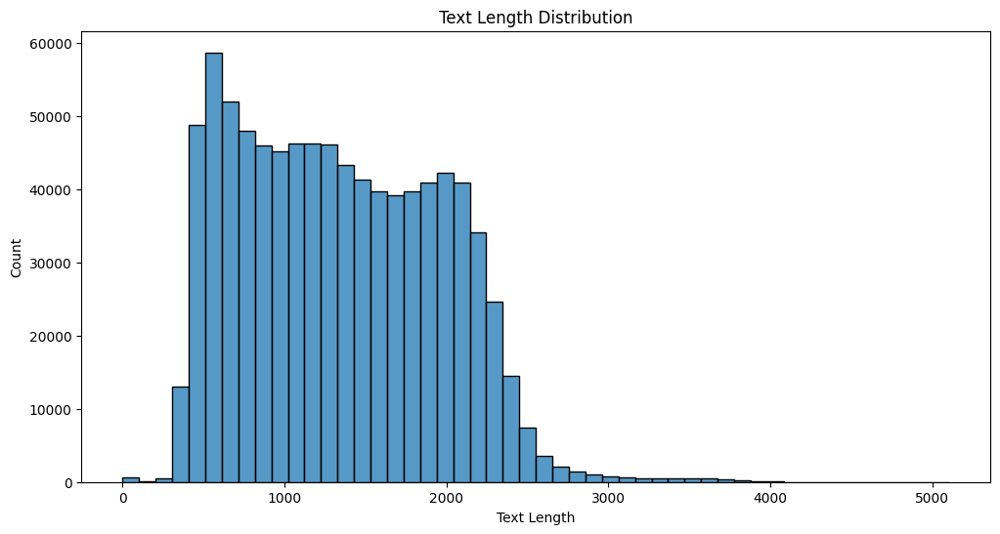

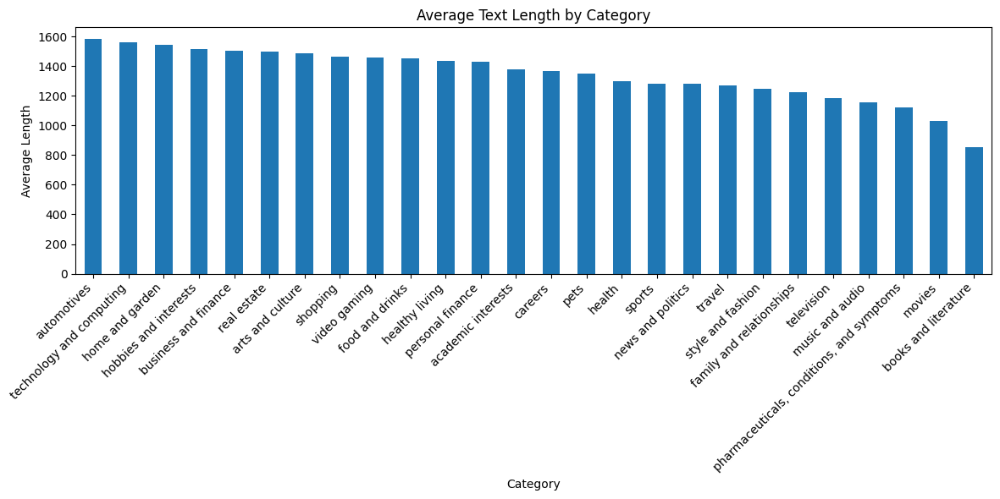

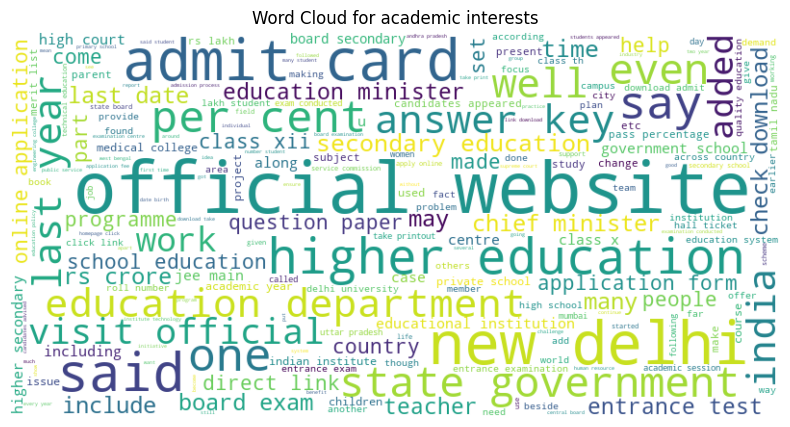

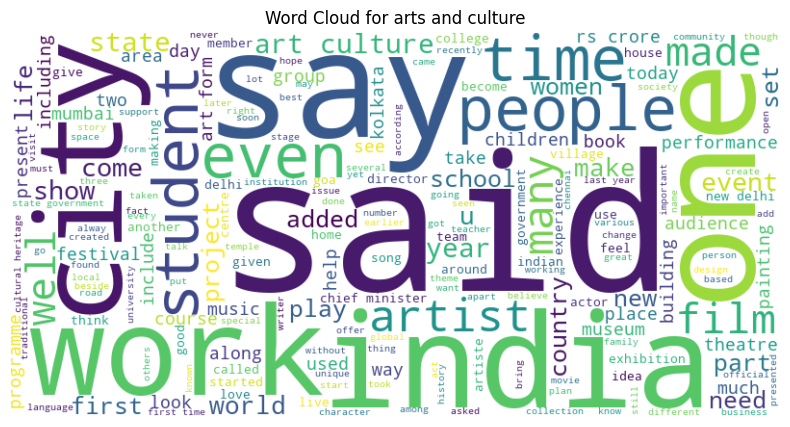

...

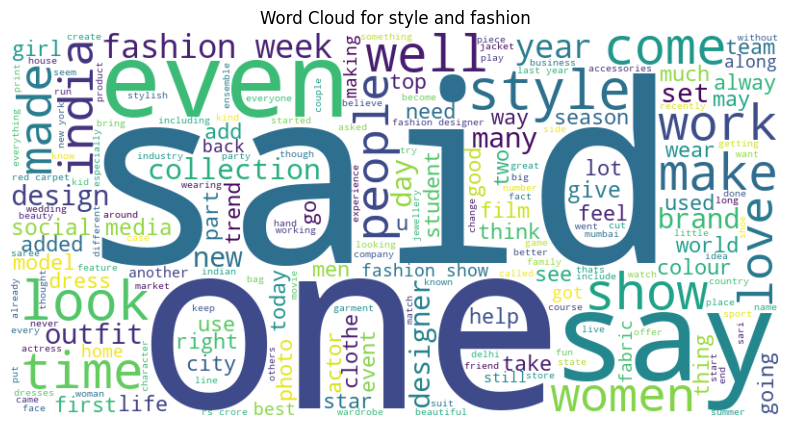

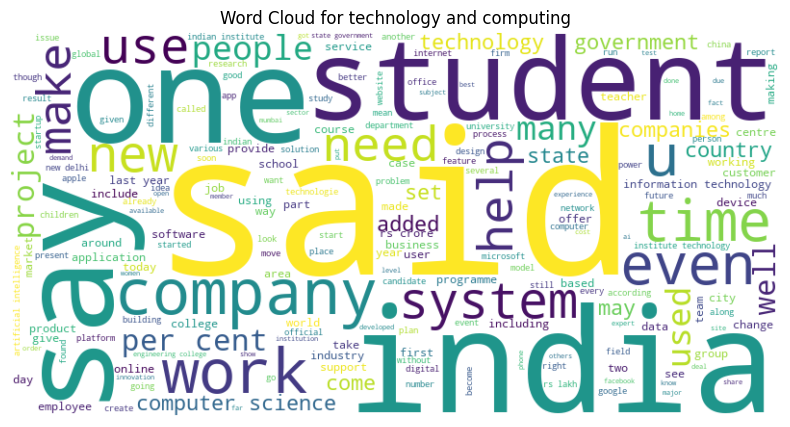

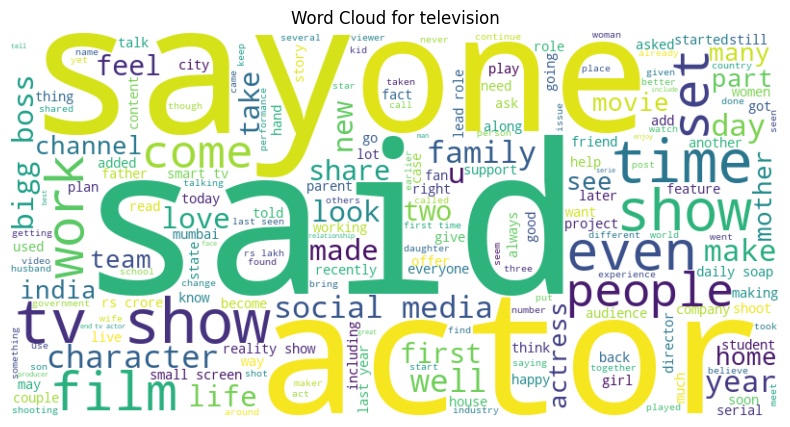

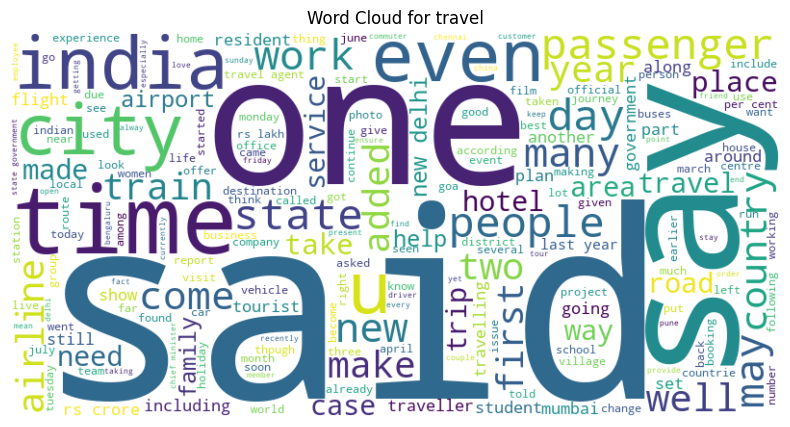

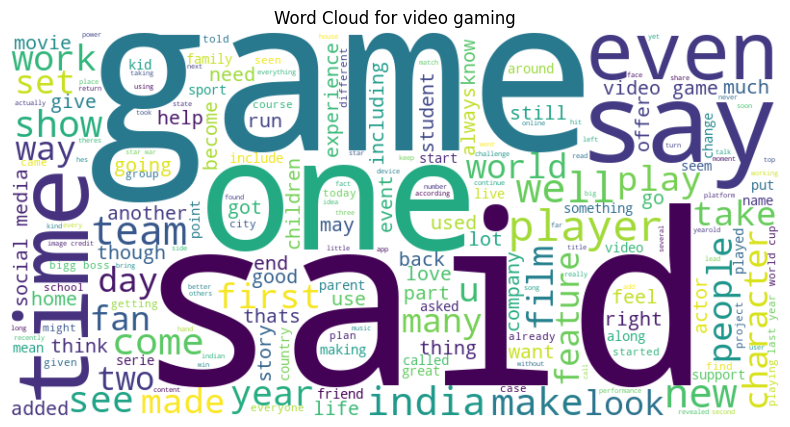

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# 1. Class distribution
plt.figure(figsize=(12, 6))
df['target'].value_counts().plot(kind='bar')
plt.title('Class Distribution')
plt.xlabel('Categories')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 2. Text length distribution
df['text_length'] = df['cleaned_text'].apply(len)
plt.figure(figsize=(12, 6))
sns.histplot(df['text_length'], bins=50)
plt.title('Text Length Distribution')
plt.xlabel('Text Length')
plt.ylabel('Count')
plt.show()

# 3. Average text length by category
avg_length = df.groupby('target')['text_length'].mean().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
avg_length.plot(kind='bar')
plt.title('Average Text Length by Category')
plt.xlabel('Category')
plt.ylabel('Average Length')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 4. Word clouds for each category
def create_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

for category in df['target'].unique():
    text = ' '.join(df[df['target'] == category]['cleaned_text'])
    create_wordcloud(text, f'Word Cloud for {category}')

Feature Extraction:

TF-IDF Vectorization for Text Data

Explanation: This snippet converts the preprocessed text data into numerical form using TF-IDF (Term Frequency-Inverse Document Frequency) vectorization, preparing it for input into a machine learning model.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=5000)
X = tfidf.fit_transform(df['cleaned_text'])
y = df['target']

Handling Class Imbalance:

Addressing Class Imbalance with SMOTE

Explanation: This code snippet uses the SMOTE (Synthetic Minority Over-sampling Technique) algorithm to balance the class distribution in the dataset by generating synthetic samples for the minority classes. This step helps improve model performance, especially in cases where certain categories are underrepresented.

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

Model Train Split

In [ ]:
from sklearn.model_selection import train_test_split

# First, split off the test set (20% of the data)
X_temp, X_test, y_temp, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# Now split the remaining 80% into training (45/80 = 56.25% of temp) and validation (35/80 = 43.75% of temp)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.4375, random_state=42, stratify=y_temp)

# Verify the split sizes
print(f"Training set size: {X_train.shape[0]} ({X_train.shape[0]/X_resampled.shape[0]:.2%})")
print(f"Validation set size: {X_val.shape[0]} ({X_val.shape[0]/X_resampled.shape[0]:.2%})")
print(f"Test set size: {X_test.shape[0]} ({X_test.shape[0]/X_resampled.shape[0]:.2%})")

Training set size: 855667 (45.00%)
Validation set size: 665520 (35.00%)
Test set size: 380297 (20.00%)


The total number of samples after resampling is 1,901,484 (855,667 + 665,520 + 380,297).
This is larger than your original dataset size of 840,000, which suggests that the SMOTE (Synthetic Minority Over-sampling Technique)
process has successfully balanced your classes by creating synthetic samples for minority classes.

Training the Model: Training and Evaluating a Logistic Regression Model

Explanation: This snippet trains a logistic regression model on the resampled dataset and evaluates its performance on  Training set, validation set and atest set.

In [ ]:
# Train the model
# Train the model
lr_model = LogisticRegression(multi_class='ovr', max_iter=1000)
lr_model.fit(X_train, y_train)

# Evaluate on training set
y_train_pred = lr_model.predict(X_train)
print("Training Set Performance:")
print(classification_report(y_train, y_train_pred))

# Evaluate on validation set
y_val_pred = lr_model.predict(X_val)
print("Validation Set Performance:")
print(classification_report(y_val, y_val_pred))

# Final evaluation on test set
y_test_pred = lr_model.predict(X_test)
print("Test Set Performance:")
print(classification_report(y_test, y_test_pred))

C:\Users\saath\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Training Set Performance:
                                           precision    recall  f1-score   support

                       academic interests       0.74      0.79      0.77     32911
                         arts and culture       0.74      0.72      0.73     32910
                              automotives       0.93      0.93      0.93     32910
                     books and literature       0.83      0.88      0.85     32910
                     business and finance       0.65      0.68      0.67     32910
                                  careers       0.99      0.97      0.98     32910
                 family and relationships       0.68      0.74      0.71     32910
                          food and drinks       0.75      0.76      0.76     32910
                                   health       0.73      0.73      0.73     32911
                           healthy living       0.67      0.63      0.65     32910
                    hobbies and interests       0.82      0.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix



In [ ]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'target' is your target column in the dataframe
le = LabelEncoder()
y = le.fit_transform(df['target'])  # Encode target labels

Generating Confution Matrix

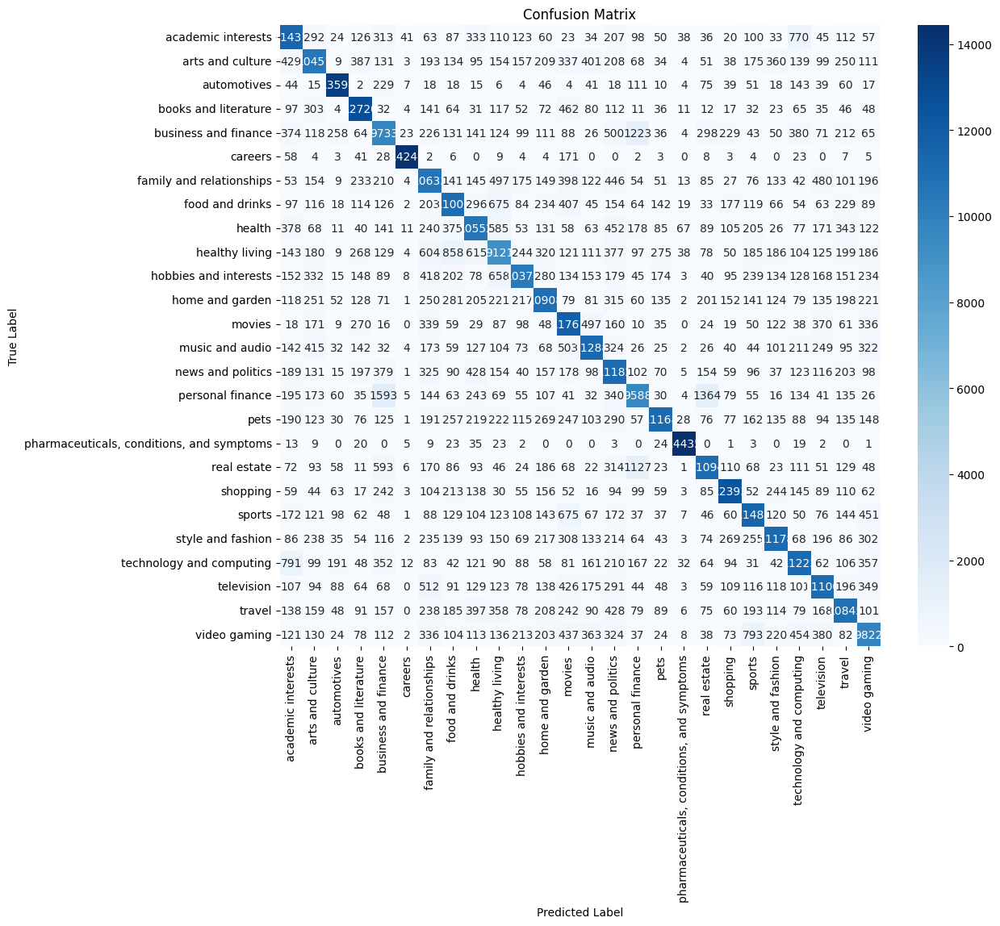

In [ ]:
# Generate confusion matrix for test set predictions
cm = confusion_matrix(y_test, y_test_pred)

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap for the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

Visualizing Classification Metrics by Class

Explanation: This code snippet creates bar plots to visualize the performance metrics (precision, recall, and F1-score) for each class in the validation set and the next visualization similary does it for test set. The visualization provides a clearer view of how the model performs across different categories

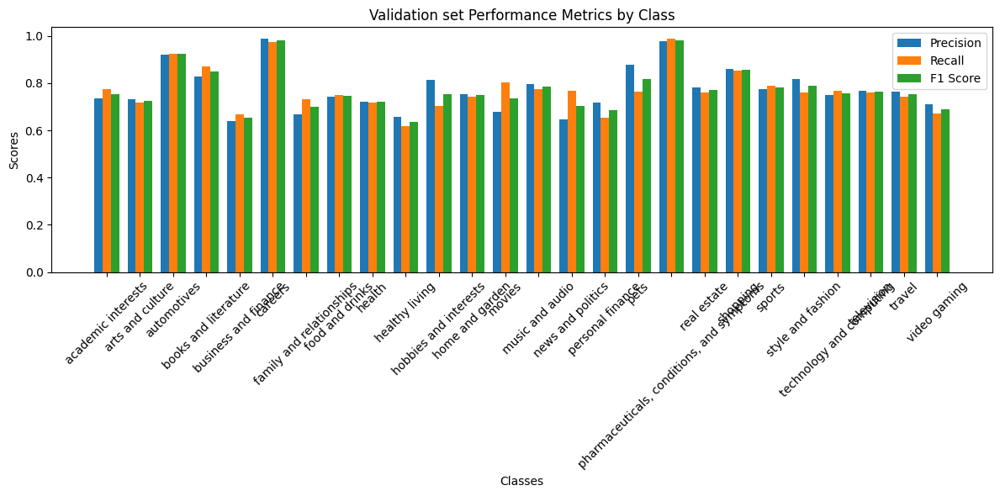

In [ ]:
import numpy as np

# Extract metrics from classification report
report = classification_report(y_val, y_val_pred, output_dict=True)
classes = list(report.keys())[:-3]  # Exclude 'accuracy', 'macro avg', 'weighted avg'
precision = [report[cls]['precision'] for cls in classes]
recall = [report[cls]['recall'] for cls in classes]
f1_score = [report[cls]['f1-score'] for cls in classes]

x = np.arange(len(classes))  # The label locations

# Create bar plots
width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width, precision, width, label='Precision')
bars2 = ax.bar(x, recall, width, label='Recall')
bars3 = ax.bar(x + width, f1_score, width, label='F1 Score')

# Add some text for labels, title and custom x-axis tick labels
ax.set_xlabel('Classes')
ax.set_ylabel('Scores')
ax.set_title('Validation set Performance Metrics by Class')
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.legend()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

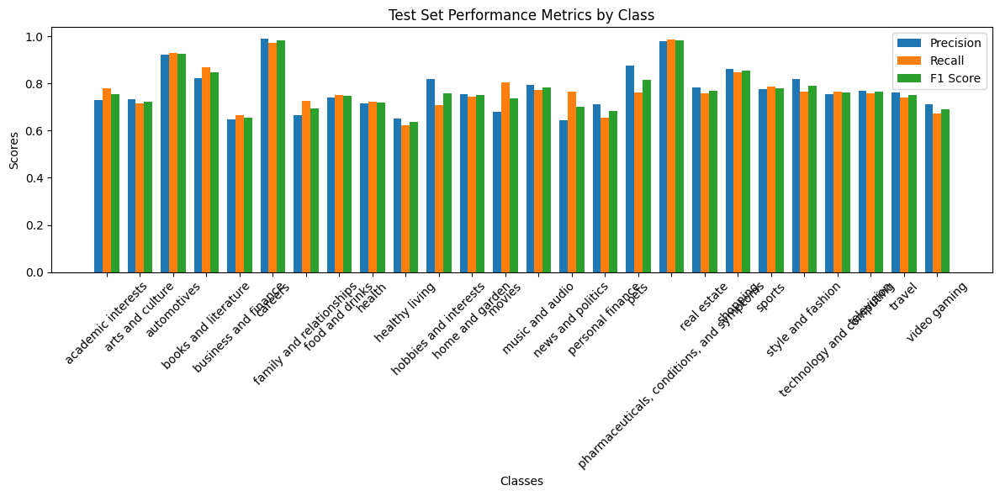

In [ ]:
# Extract metrics from classification report for test set
test_report = classification_report(y_test, y_test_pred, output_dict=True)
test_classes = list(test_report.keys())[:-3]  # Exclude 'accuracy', 'macro avg', 'weighted avg'
test_precision = [test_report[cls]['precision'] for cls in test_classes]
test_recall = [test_report[cls]['recall'] for cls in test_classes]
test_f1_score = [test_report[cls]['f1-score'] for cls in test_classes]

x = np.arange(len(test_classes))  # The label locations
width = 0.25  # Width of the bars

# Create bar plots
fig, ax = plt.subplots(figsize=(12, 6))
bars1 = ax.bar(x - width, test_precision, width, label='Precision')
bars2 = ax.bar(x, test_recall, width, label='Recall')
bars3 = ax.bar(x + width, test_f1_score, width, label='F1 Score')

# Add labels, title and custom x-axis tick labels
ax.set_xlabel('Classes')
ax.set_ylabel('Scores')
ax.set_title('Test Set Performance Metrics by Class')
ax.set_xticks(x)
ax.set_xticklabels(test_classes)
ax.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()